# UFC Winner Prediction — Modeling Pipeline (Pre-fight features only)

This notebook builds models to predict fight winners using **only pre-fight features** from `/mnt/data/ufc-master.csv`.

In [1]:
# 1. Setup
import pandas as pd, numpy as np
csv_path = "ufc-master.csv"
df = pd.read_csv(csv_path)
print("Loaded:", df.shape)
df.head()

Loaded: (6541, 118)


,RedFighter,BlueFighter,RedOdds,BlueOdds,RedExpectedValue,BlueExpectedValue,Date,Location,Country,Winner,...,FinishDetails,FinishRound,FinishRoundTime,TotalFightTimeSecs,RedDecOdds,BlueDecOdds,RSubOdds,BSubOdds,RKOOdds,BKOOdds
0,Colby Covington,Joaquin Buckley,205.0,-250.0,205.0000,40.0000,2024-12-14,"Tampa, Florida, USA",USA,Blue,...,NaN,3.0,4:42,882.0,300.0,175.0,1800.0,2000.0,1100.0,150.0
1,Cub Swanson,Billy Quarantillo,124.0,-148.0,124.0000,67.5676,2024-12-14,"Tampa, Florida, USA",USA,Red,...,Punch,3.0,1:36,696.0,250.0,NaN,1800.0,NaN,450.0,NaN
2,Manel Kape,Bruno Silva,-395.0,310.0,25.3165,310.0000,2024-12-14,"Tampa, Florida, USA",USA,Red,...,Punches,3.0,1:57,717.0,-105.0,550.0,900.0,1800.0,225.0,1100.0
3,Vitor Petrino,Dustin Jacoby,-340.0,270.0,29.4118,270.0000,2024-12-14,"Tampa, Florida, USA",USA,Blue,...,Punch,3.0,3:44,824.0,240.0,500.0,550.0,3000.0,110.0,800.0
4,Adrian Yanez,Daniel Marcos,185.0,-225.0,185.0000,44.4444,2024-12-14,"Tampa, Florida, USA",USA,Blue,...,NaN,3.0,5:00,900.0,450.0,150.0,2200.0,2200.0,450.0,200.0


In [2]:
# 2. Quick column inspection
print("Columns (first 80):", list(df.columns)[:80])
for key in ['Blue','Red','Dif','Odds','Stance','WeightClass','TitleBout','Reach','Height','Age']:
    cols = [c for c in df.columns if key in c]
    if cols:
        print(f"\nColumns containing '{key}': {cols[:10]}{'...' if len(cols)>10 else ''}")

Columns (first 80): ['RedFighter', 'BlueFighter', 'RedOdds', 'BlueOdds', 'RedExpectedValue', 'BlueExpectedValue', 'Date', 'Location', 'Country', 'Winner', 'TitleBout', 'WeightClass', 'Gender', 'NumberOfRounds', 'BlueCurrentLoseStreak', 'BlueCurrentWinStreak', 'BlueDraws', 'BlueAvgSigStrLanded', 'BlueAvgSigStrPct', 'BlueAvgSubAtt', 'BlueAvgTDLanded', 'BlueAvgTDPct', 'BlueLongestWinStreak', 'BlueLosses', 'BlueTotalRoundsFought', 'BlueTotalTitleBouts', 'BlueWinsByDecisionMajority', 'BlueWinsByDecisionSplit', 'BlueWinsByDecisionUnanimous', 'BlueWinsByKO', 'BlueWinsBySubmission', 'BlueWinsByTKODoctorStoppage', 'BlueWins', 'BlueStance', 'BlueHeightCms', 'BlueReachCms', 'BlueWeightLbs', 'RedCurrentLoseStreak', 'RedCurrentWinStreak', 'RedDraws', 'RedAvgSigStrLanded', 'RedAvgSigStrPct', 'RedAvgSubAtt', 'RedAvgTDLanded', 'RedAvgTDPct', 'RedLongestWinStreak', 'RedLosses', 'RedTotalRoundsFought', 'RedTotalTitleBouts', 'RedWinsByDecisionMajority', 'RedWinsByDecisionSplit', 'RedWinsByDecisionUnanimo

In [3]:
# 3. Create target and mark leakage columns
df['BlueWin'] = (df['Winner'] == 'Blue').astype(int)
leak_cols = [c for c in df.columns if any(x in c for x in ['Finish','FinishRound','FinishRoundTime','TotalFightTime','TotalFightTimeSecs'])]
print("Leak/post-fight columns detected:", leak_cols)

Leak/post-fight columns detected: ['Finish', 'FinishDetails', 'FinishRound', 'FinishRoundTime', 'TotalFightTimeSecs']


In [4]:
# 4. Select pre-fight features programmatically
cols = df.columns.tolist()
exclude = set(['Winner','BlueWin','RedFighter','BlueFighter','Date','Location'])
exclude |= set([c for c in cols if any(x in c for x in ['Finish','TotalFightTime','Referee'])])
include_keywords = ['Blue','Red','Dif','Odds','Implied','Age','Reach','Height','Weight','Stance','Rank','TitleBout','WeightClass','NumberOfRounds','Country','Gender']

feature_cols = [c for c in cols if (c not in exclude) and any(k in c for k in include_keywords)]
numeric_cols = [c for c in feature_cols if pd.api.types.is_numeric_dtype(df[c])]
categorical_cols = [c for c in feature_cols if not pd.api.types.is_numeric_dtype(df[c])]
print("Selected features:", len(feature_cols))
print("Numeric sample:", numeric_cols[:20])
print("Categorical sample:", categorical_cols[:20])

Selected features: 107
Numeric sample: ['RedOdds', 'BlueOdds', 'RedExpectedValue', 'BlueExpectedValue', 'TitleBout', 'NumberOfRounds', 'BlueCurrentLoseStreak', 'BlueCurrentWinStreak', 'BlueDraws', 'BlueAvgSigStrLanded', 'BlueAvgSigStrPct', 'BlueAvgSubAtt', 'BlueAvgTDLanded', 'BlueAvgTDPct', 'BlueLongestWinStreak', 'BlueLosses', 'BlueTotalRoundsFought', 'BlueTotalTitleBouts', 'BlueWinsByDecisionMajority', 'BlueWinsByDecisionSplit']
Categorical sample: ['Country', 'WeightClass', 'Gender', 'BlueStance', 'RedStance', 'BetterRank']


In [5]:
from sklearn.model_selection import train_test_split
X = df[feature_cols].copy()
y = df['BlueWin'].copy()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)
print("Train/test:", X_train.shape, X_test.shape)

Train/test: (5232, 107) (1309, 107)


In [6]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder

numeric_transformer = Pipeline([('imputer', SimpleImputer(strategy='median')), ('scaler', StandardScaler())])
categorical_transformer = Pipeline([('imputer', SimpleImputer(strategy='most_frequent')), ('ohe', OneHotEncoder(handle_unknown='ignore', sparse_output=False))])

preprocessor = ColumnTransformer([('num', numeric_transformer, numeric_cols),
                                  ('cat', categorical_transformer, categorical_cols)], sparse_threshold=0)

In [7]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
models = {
    'LogisticRegression': Pipeline([('pre', preprocessor), ('clf', LogisticRegression(max_iter=2000, class_weight='balanced', random_state=42))]),
    'RandomForest': Pipeline([('pre', preprocessor), ('clf', RandomForestClassifier(n_estimators=200, n_jobs=-1, random_state=42))]),
    'GradientBoosting': Pipeline([('pre', preprocessor), ('clf', GradientBoostingClassifier(n_estimators=200, random_state=42))]),
    'MLP': Pipeline([('pre', preprocessor), ('clf', MLPClassifier(hidden_layer_sizes=(128,64), max_iter=500, random_state=42))])
}
# Try to add XGBoost if available
try:
    from xgboost import XGBClassifier
    models['XGBoost'] = Pipeline([('pre', preprocessor), ('clf', XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42))])
    print("XGBoost added")
except Exception as e:
    print("XGBoost not available:", e)

XGBoost added


In [8]:
from sklearn.model_selection import StratifiedKFold, cross_val_score
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scoring = ['accuracy','f1','roc_auc']

import numpy as np
for name, model in models.items():
    print("\nModel:", name)
    try:
        acc = cross_val_score(model, X_train, y_train, cv=cv, scoring='accuracy', n_jobs=-1)
        f1 = cross_val_score(model, X_train, y_train, cv=cv, scoring='f1', n_jobs=-1)
        roc = cross_val_score(model, X_train, y_train, cv=cv, scoring='roc_auc', n_jobs=-1)
        print("Accuracy: %.4f ± %.4f" % (acc.mean(), acc.std()))
        print("F1: %.4f ± %.4f" % (f1.mean(), f1.std()))
        print("ROC AUC: %.4f ± %.4f" % (roc.mean(), roc.std()))
    except Exception as e:
        print("Error CV for", name, e)


Model: LogisticRegression


/opt/miniconda3/lib/python3.13/site-packages/sklearn/impute/_base.py:653: UserWarning: Skipping features without any observed values: ['BWFeatherweightRank']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/opt/miniconda3/lib/python3.13/site-packages/sklearn/impute/_base.py:653: UserWarning: Skipping features without any observed values: ['BWFeatherweightRank']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/opt/miniconda3/lib/python3.13/site-packages/sklearn/impute/_base.py:653: UserWarning: Skipping features without any observed values: ['BWFeatherweightRank']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/opt/miniconda3/lib/python3.13/site-packages/sklearn/impute/_base.py:653: UserWarning: Skipping features without any observed values: ['BWFeatherweightRank']. At least one non-missing value is needed for imputation with strategy='me

Accuracy: 0.6330 ± 0.0128
F1: 0.5927 ± 0.0129
ROC AUC: 0.6923 ± 0.0128

Model: RandomForest


/opt/miniconda3/lib/python3.13/site-packages/sklearn/impute/_base.py:653: UserWarning: Skipping features without any observed values: ['BWFeatherweightRank']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/opt/miniconda3/lib/python3.13/site-packages/sklearn/impute/_base.py:653: UserWarning: Skipping features without any observed values: ['BWFeatherweightRank']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/opt/miniconda3/lib/python3.13/site-packages/sklearn/impute/_base.py:653: UserWarning: Skipping features without any observed values: ['BWFeatherweightRank']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/opt/miniconda3/lib/python3.13/site-packages/sklearn/impute/_base.py:653: UserWarning: Skipping features without any observed values: ['BWFeatherweightRank']. At least one non-missing value is needed for imputation with strategy='me

Accuracy: 0.6521 ± 0.0107
F1: 0.5429 ± 0.0160
ROC AUC: 0.6950 ± 0.0133

Model: GradientBoosting


/opt/miniconda3/lib/python3.13/site-packages/sklearn/impute/_base.py:653: UserWarning: Skipping features without any observed values: ['BWFeatherweightRank']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/opt/miniconda3/lib/python3.13/site-packages/sklearn/impute/_base.py:653: UserWarning: Skipping features without any observed values: ['BWFeatherweightRank']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/opt/miniconda3/lib/python3.13/site-packages/sklearn/impute/_base.py:653: UserWarning: Skipping features without any observed values: ['BWFeatherweightRank']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/opt/miniconda3/lib/python3.13/site-packages/sklearn/impute/_base.py:653: UserWarning: Skipping features without any observed values: ['BWFeatherweightRank']. At least one non-missing value is needed for imputation with strategy='me

Accuracy: 0.6422 ± 0.0123
F1: 0.5321 ± 0.0154
ROC AUC: 0.6892 ± 0.0132

Model: MLP


/opt/miniconda3/lib/python3.13/site-packages/sklearn/impute/_base.py:653: UserWarning: Skipping features without any observed values: ['BWFeatherweightRank']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/opt/miniconda3/lib/python3.13/site-packages/sklearn/impute/_base.py:653: UserWarning: Skipping features without any observed values: ['BWFeatherweightRank']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/opt/miniconda3/lib/python3.13/site-packages/sklearn/impute/_base.py:653: UserWarning: Skipping features without any observed values: ['BWFeatherweightRank']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/opt/miniconda3/lib/python3.13/site-packages/sklearn/impute/_base.py:653: UserWarning: Skipping features without any observed values: ['BWFeatherweightRank']. At least one non-missing value is needed for imputation with strategy='me

Accuracy: 0.5795 ± 0.0071
F1: 0.4942 ± 0.0100
ROC AUC: 0.5989 ± 0.0119

Model: XGBoost


/opt/miniconda3/lib/python3.13/site-packages/sklearn/impute/_base.py:653: UserWarning: Skipping features without any observed values: ['BWFeatherweightRank']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(
/opt/miniconda3/lib/python3.13/site-packages/xgboost/training.py:199: UserWarning: [13:31:26] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/opt/miniconda3/lib/python3.13/site-packages/xgboost/training.py:199: UserWarning: [13:31:26] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/opt/miniconda3/lib/python3.13/site-packages/xgboost/training.py:199: UserWarning: [13:31:26] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, itera

Accuracy: 0.6290 ± 0.0136
F1: 0.5311 ± 0.0193
ROC AUC: 0.6621 ± 0.0072


/opt/miniconda3/lib/python3.13/site-packages/sklearn/impute/_base.py:653: UserWarning: Skipping features without any observed values: ['BWFeatherweightRank']. At least one non-missing value is needed for imputation with strategy='median'.
  warnings.warn(


In [9]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
results = []
for name, model in models.items():
    print("\nTraining:", name)
    try:
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        if hasattr(model.named_steps['clf'], 'predict_proba'):
            y_proba = model.predict_proba(X_test)[:,1]
        else:
            y_proba = None
        acc = accuracy_score(y_test, y_pred)
        prec = precision_score(y_test, y_pred)
        rec = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        roc = roc_auc_score(y_test, y_proba) if y_proba is not None else float('nan')
        print(f"Acc: {acc:.4f} | Prec: {prec:.4f} | Rec: {rec:.4f} | F1: {f1:.4f} | ROC-AUC: {roc:.4f}")
        print("Confusion matrix:\n", confusion_matrix(y_test, y_pred))
        results.append({'model': name, 'accuracy': acc, 'precision': prec, 'recall': rec, 'f1': f1, 'roc_auc': roc})
    except Exception as e:
        print("Error training/evaluating", name, e)

import pandas as pd
print("\nSummary:")
display(pd.DataFrame(results).set_index('model').sort_values('f1', ascending=False))


Training: LogisticRegression
Acc: 0.6394 | Prec: 0.5633 | Rec: 0.6309 | F1: 0.5952 | ROC-AUC: 0.7057
Confusion matrix:
 [[490 269]
 [203 347]]

Training: RandomForest
Acc: 0.6639 | Prec: 0.6239 | Rec: 0.5036 | F1: 0.5573 | ROC-AUC: 0.7126
Confusion matrix:
 [[592 167]
 [273 277]]

Training: GradientBoosting
Acc: 0.6455 | Prec: 0.5982 | Rec: 0.4764 | F1: 0.5304 | ROC-AUC: 0.7089
Confusion matrix:
 [[583 176]
 [288 262]]

Training: MLP
Acc: 0.5982 | Prec: 0.5217 | Rec: 0.5236 | F1: 0.5227 | ROC-AUC: 0.6220
Confusion matrix:
 [[495 264]
 [262 288]]

Training: XGBoost
Acc: 0.6234 | Prec: 0.5583 | Rec: 0.4964 | F1: 0.5255 | ROC-AUC: 0.6706
Confusion matrix:
 [[543 216]
 [277 273]]

Summary:


/opt/miniconda3/lib/python3.13/site-packages/xgboost/training.py:199: UserWarning: [13:31:35] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


,accuracy,precision,recall,f1,roc_auc
model,,,,,
LogisticRegression,0.639419,0.563312,0.630909,0.595197,0.705723
RandomForest,0.663866,0.623874,0.503636,0.557344,0.712605
GradientBoosting,0.645531,0.598174,0.476364,0.530364,0.708909
XGBoost,0.623377,0.558282,0.496364,0.525505,0.670574
MLP,0.598167,0.521739,0.523636,0.522686,0.622024


RedExpectedValue           0.041827
BlueOdds                   0.040295
RedOdds                    0.039314
BlueExpectedValue          0.038164
BlueDecOdds                0.025131
                             ...   
RFlyweightRank             0.000987
RHeavyweightRank           0.000966
RPFPRank                   0.000964
Country_ United Kingdom    0.000953
RWBantamweightRank         0.000946
Length: 107, dtype: float64

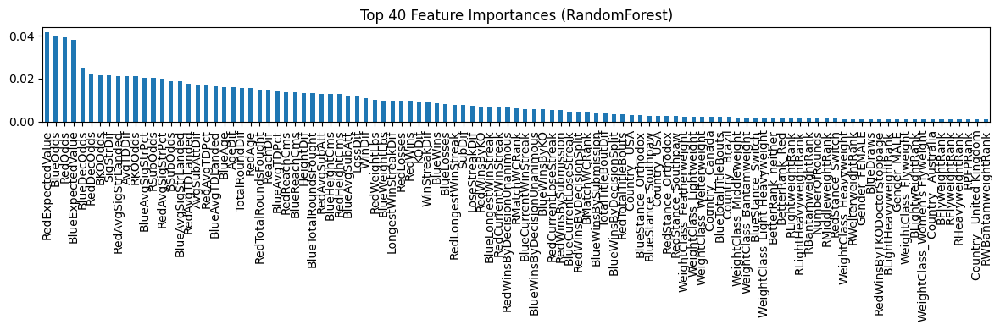

In [14]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree
# Feature importances for tree-based models (example for RandomForest)
def get_feature_names(preprocessor):
    num_names = list(preprocessor.transformers_[0][2])
    cat_trans = preprocessor.transformers_[1][1]
    if hasattr(cat_trans.named_steps['ohe'], 'get_feature_names_out'):
        cat_names = list(cat_trans.named_steps['ohe'].get_feature_names_out(preprocessor.transformers_[1][2]))
    else:
        cat_names = []
    return num_names + cat_names

if 'RandomForest' in models:
    try:
        rf = models['RandomForest']
        pre = rf.named_steps['pre']
        clf = rf.named_steps['clf']
        feat_names = get_feature_names(pre)
        imp = clf.feature_importances_
        importances = pd.Series(imp, index=feat_names).sort_values(ascending=False).head(107)
        display(importances)
        importances.plot(kind='bar', figsize=(12,4))
        plt.title('Top 40 Feature Importances (RandomForest)')
        plt.tight_layout()
        plt.show()

        individual_tree = clf.estimators_[10]
        plt.figure(figsize=(214,107))
        plot_tree(individual_tree, feature_names=feat_names, class_names=['RedWin','BlueWin'], filled=True, fontsize=8)
        plt.title('Example Decision Tree from RandomForest')
        plt.show()
    except Exception as e:
        print("Could not compute feature importances:", e)

/opt/miniconda3/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


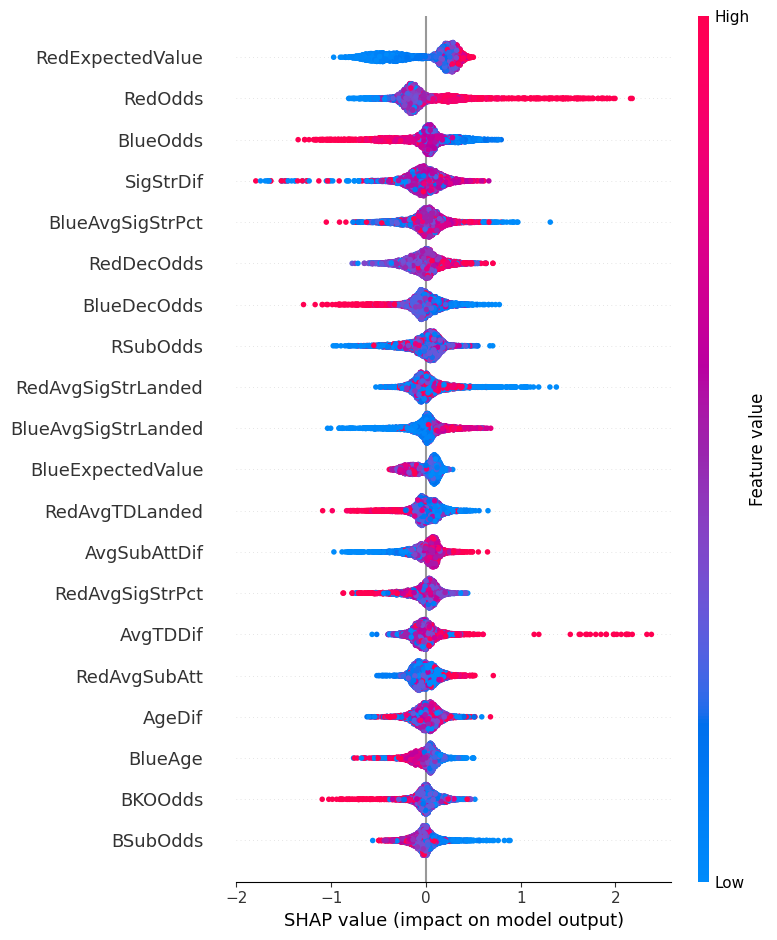

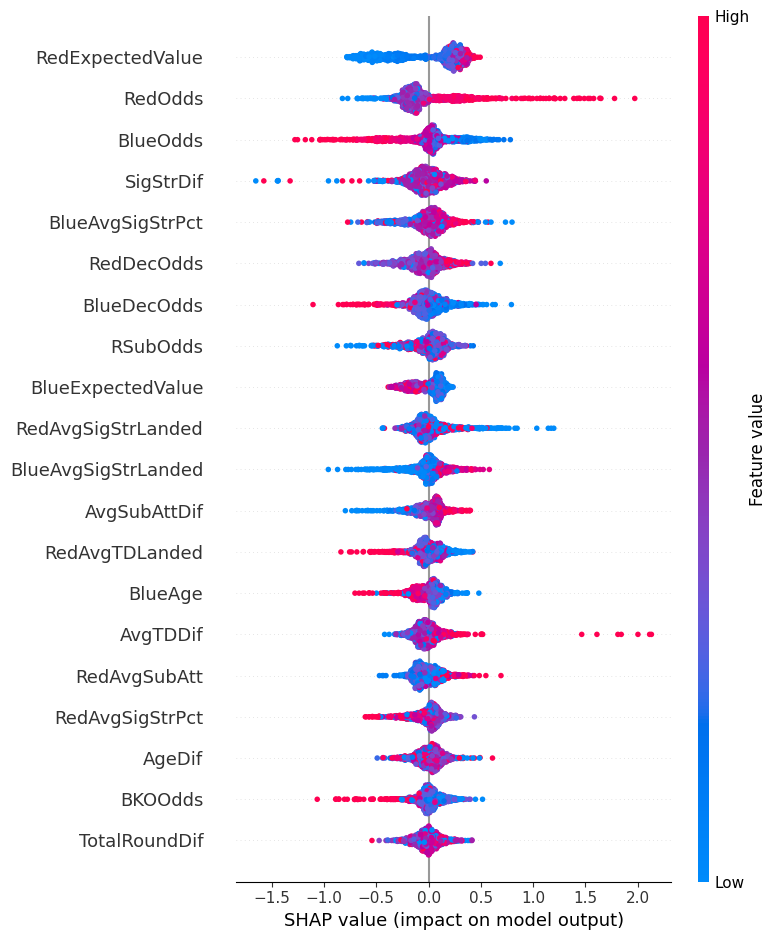

In [12]:
import shap
import tqdm as notebook_tqdm
# SHAP values for XGBoost (if available)
if 'XGBoost' in models:
    try:
        xgb = models['XGBoost']
        pre = xgb.named_steps['pre']
        clf = xgb.named_steps['clf']
        X_train_transformed = pre.transform(X_train)
        explainer = shap.Explainer(clf)
        shap_values = explainer(X_train_transformed)
        shap.summary_plot(shap_values, features=X_train_transformed, feature_names=get_feature_names(pre))
        
        X_test_transformed = pre.transform(X_test)
        explainer = shap.Explainer(clf)
        shap_values = explainer(X_test_transformed)
        shap.summary_plot(shap_values, features=X_test_transformed, feature_names=get_feature_names(pre))
    except Exception as e:
        print("Could not compute SHAP values:", e)


In [ ]:
import shap
import tqdm as notebook_tqdm
# SHAP values for random forest
if 'RandomForest' in models:
    try:
        rf = models['RandomForest']
        pre = rf.named_steps['pre']
        clf = rf.named_steps['clf']
        X_train_transformed = pre.transform(X_train)
        explainer = shap.TreeExplainer(clf)
        shap_values = explainer(X_train_transformed)
        shap.summary_plot(shap_values, features=X_train_transformed, feature_names=get_feature_names(pre))

        X_test_transformed = pre.transform(X_test)
        explainer = shap.TreeExplainer(clf)
        shap_values = explainer(X_test_transformed)
        shap.summary_plot(shap_values, features=X_test_transformed, feature_names=get_feature_names(pre))
    except Exception as e:
        print("Could not compute SHAP values for RandomForest:", e)